# Fraud & Anomaly Detection

This notebook addresses the common practice in fraud detection projects of balancing data and applying supervised algorithms with available class labels. This notebook takes a distinct approach by avoiding data balancing and utilizing algorithms designed for anomaly detection, exploring both unsupervised and supervised forms. Key insights from the notebook involve identifying similar transaction patterns using Cosine Similarity, visualizing fraud instances in 3D through PCA and t-SNE, and implementing various anomaly detection algorithms in unsupervised and supervised scenarios. The author also notes the use of Self-Organized Maps for fraud detection.






In [1]:
!pip install minisom



Traceback (most recent call last):
  File "C:\Users\abudh\anaconda3\Scripts\pip-script.py", line 9, in <module>
    sys.exit(main())
             ^^^^^^
  File "C:\Users\abudh\anaconda3\Lib\site-packages\pip\_internal\cli\main.py", line 77, in main
    command = create_command(cmd_name, isolated=("--isolated" in cmd_args))
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\abudh\anaconda3\Lib\site-packages\pip\_internal\commands\__init__.py", line 114, in create_command
    module = importlib.import_module(module_path)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\abudh\anaconda3\Lib\importlib\__init__.py", line 126, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<frozen importlib._bootstrap>", line 1204, in _gcd_import
  File "<frozen importlib._bootstrap>", line 1176, in _find_and_load
  File "<frozen importlib._boots

## Importing Data

In [2]:
import pandas as pd
data = pd.read_csv('creditcard.csv')
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [4]:
data["Class"].value_counts()


Class
0    284315
1       492
Name: count, dtype: int64

In [5]:
import warnings
warnings.filterwarnings("ignore")

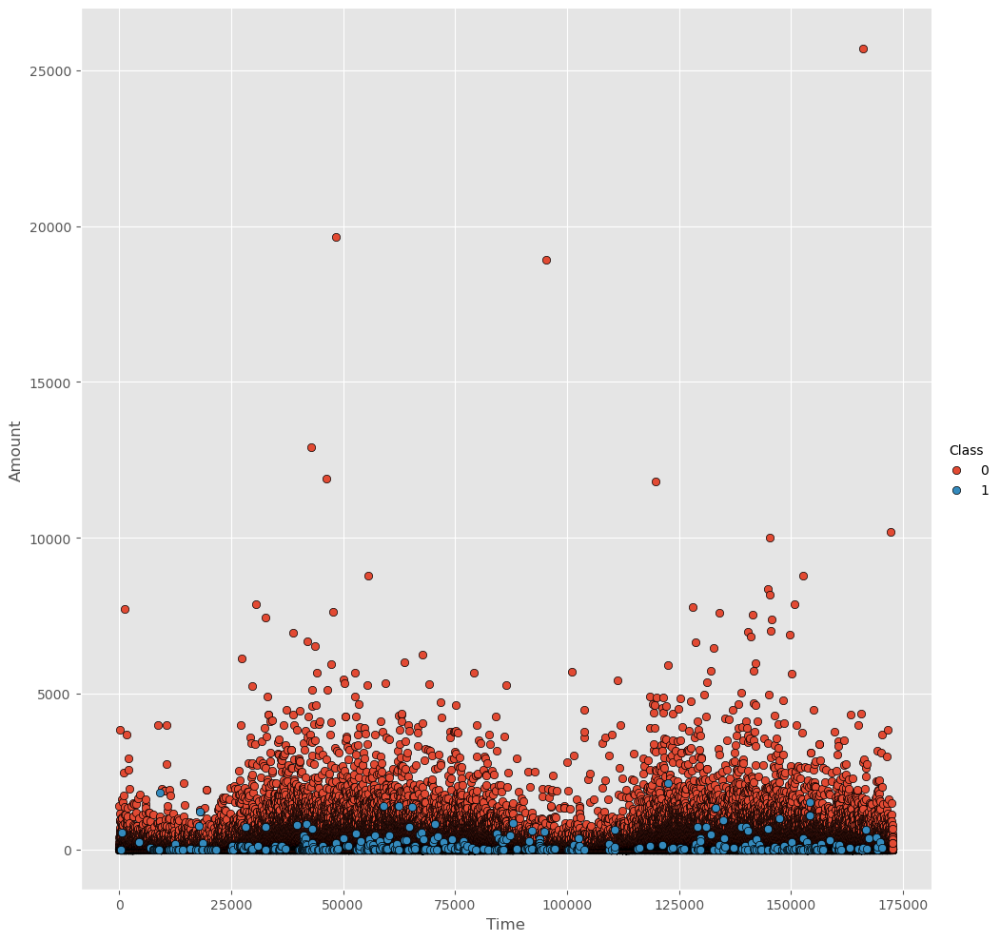

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.style.use("ggplot")
sns.FacetGrid(data, hue="Class", height=10).map(plt.scatter, "Time", "Amount", edgecolor="k").add_legend()
plt.show()


The plot indicates that frauds occur exclusively in transactions with amounts less than approximately 2500. Despite this concentration in transaction amounts, frauds are evenly distributed across all time periods.






## Finding Similarity in Transactions:

In the analysis using the Cosine Similarity metric, a substantial sample of 284,800 transactions was extracted from the dataset. For the remaining 6 transactions, each transaction is compared with the sample set to identify the top 5 transactions with the highest cosine similarity based on the formula: similarity(i,j) = dot product (vi, vj) / length(vi) * length(vj).






In [7]:
from scipy import spatial
sample_data = data.head(284800) 
samples = data.loc[284801:284807]
samples

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
284801,172785.0,0.120316,0.931005,-0.546012,-0.745097,1.130314,-0.235973,0.812722,0.115093,-0.204064,...,-0.314205,-0.808520,0.050343,0.102800,-0.435870,0.124079,0.217940,0.068803,2.69,0
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0
284806,172792.0,-0.533413,-0.189733,0.703337,-0.506271,-0.012546,-0.649617,1.577006,-0.414650,0.486180,...,0.261057,0.643078,0.376777,0.008797,-0.473649,-0.818267,-0.002415,0.013649,217.00,0


In [8]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return False;
}

<IPython.core.display.Javascript object>

In [9]:

print("1")
frame = []
for i in range(284801, 284807): 
    t1 = samples.loc[i]
    cls = samples.loc[i]["Class"]
    for j in range(284800):
        t2 = sample_data.loc[j]
        class_label = data.loc[j]["Class"]
        similarity = 1 - spatial.distance.cosine(t1, t2)
        if (class_label == 1):
            frame.append([class_label, similarity, j])
    print("2")
    
    df = pd.DataFrame(frame, columns=['Class', 'Similarity', 'Transaction ID'])
    df_sorted = df.sort_values("Similarity", ascending=False)
    print("3")

    print("Top 5 suspected-fraud transactions having highest similarity with transaction ID = "+str(i)+ ":")
    print(df_sorted.iloc[:5])
    print("4")

    print("\n")
    frame = []
    print("5")


1
2
3
Top 5 suspected-fraud transactions having highest similarity with transaction ID = 284801:
     Class  Similarity  Transaction ID
404    1.0         1.0          219025
476    1.0         1.0          263080
447    1.0         1.0          245347
399    1.0         1.0          214775
410    1.0         1.0          222419
4


5
2
3
Top 5 suspected-fraud transactions having highest similarity with transaction ID = 284802:
     Class  Similarity  Transaction ID
399    1.0         1.0          214775
404    1.0         1.0          219025
476    1.0         1.0          263080
452    1.0         1.0          248971
410    1.0         1.0          222419
4


5
2
3
Top 5 suspected-fraud transactions having highest similarity with transaction ID = 284803:
     Class  Similarity  Transaction ID
485    1.0         1.0          276071
434    1.0         1.0          238466
396    1.0         1.0          213092
194    1.0         1.0           79874
157    1.0         1.0           57248

## Visualizing Frauds in 3D with PCA

PCA (Principal Component Analysis) is an unsupervised linear dimensionality reduction technique that aims to preserve the global structure of data. It is a deterministic method. In this analysis, the entire dataset is reduced into three principal components, and a plot is generated to visualize anomalies. Outliers are represented by red cross points, while green points indicate inliers.






1
2
3
4
5


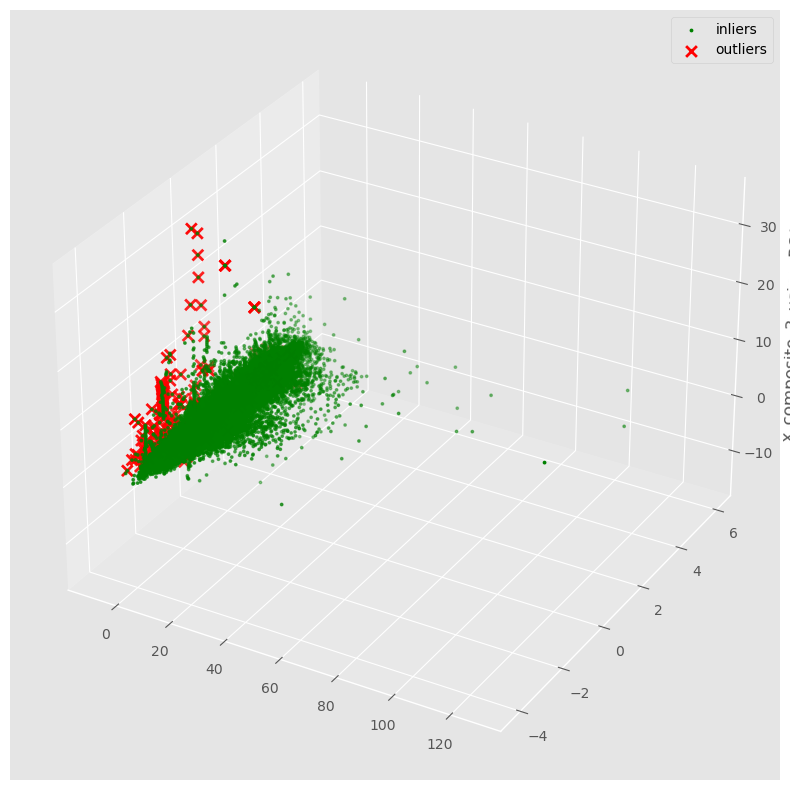

In [10]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
pca = PCA(n_components=3)  #Considered only 3 components to put into 3 dimensions
to_model_cols = data.columns[0:30]
print("1")
outliers = data.loc[data['Class']==1]
outlier_index=list(outliers.index)
print("2")

scaler = StandardScaler()
X = scaler.fit_transform(data[to_model_cols])
print("3")

X_reduce = pca.fit_transform(X)
print("4")

fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.set_zlabel("x_composite_3_using_PCA")
print("5")

# Plotting compressed data points
ax.scatter(X_reduce[:, 0], X_reduce[:, 1], zs=X_reduce[:, 2], s=3, lw=1, label="inliers",c="green")
# Plot x for the ground truth outliers
ax.scatter(X_reduce[outlier_index,0],X_reduce[outlier_index,1], X_reduce[outlier_index,2],
           s=60, lw=2, marker="x", c="red", label="outliers")
ax.legend()
plt.show()

### Visualizing Frauds in 3D using t-SNE

t-SNE (t-distributed Stochastic Neighbourhood Embedding) is an unsupervised non-linear dimensionality reduction technique focused on preserving the local structure of data. Unlike PCA, which preserves large distances between data points, t-SNE aims to preserve data points that are close to each other. The analysis involves reducing the entire dataset into three t-SNE components and generating a plot to visualize anomalies. It is important to note that t-SNE is a non-deterministic or probabilistic method. To expedite execution, a smaller subset of 50,000 transaction records was used from the original dataset.






In [11]:
from sklearn.manifold import TSNE
standardized_data = StandardScaler().fit_transform(data)
data_50k = standardized_data[0:50000]
tsne = TSNE(n_components=3, verbose=1, perplexity=40, n_iter=250)
data_50k_reduced = tsne.fit_transform(data_50k)
print("Finished")

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 50000 samples in 0.010s...
[t-SNE] Computed neighbors for 50000 samples in 7.216s...
[t-SNE] Computed conditional probabilities for sample 1000 / 50000
[t-SNE] Computed conditional probabilities for sample 2000 / 50000
[t-SNE] Computed conditional probabilities for sample 3000 / 50000
[t-SNE] Computed conditional probabilities for sample 4000 / 50000
[t-SNE] Computed conditional probabilities for sample 5000 / 50000
[t-SNE] Computed conditional probabilities for sample 6000 / 50000
[t-SNE] Computed conditional probabilities for sample 7000 / 50000
[t-SNE] Computed conditional probabilities for sample 8000 / 50000
[t-SNE] Computed conditional probabilities for sample 9000 / 50000
[t-SNE] Computed conditional probabilities for sample 10000 / 50000
[t-SNE] Computed conditional probabilities for sample 11000 / 50000
[t-SNE] Computed conditional probabilities for sample 12000 / 50000
[t-SNE] Computed conditional probabilities for sa

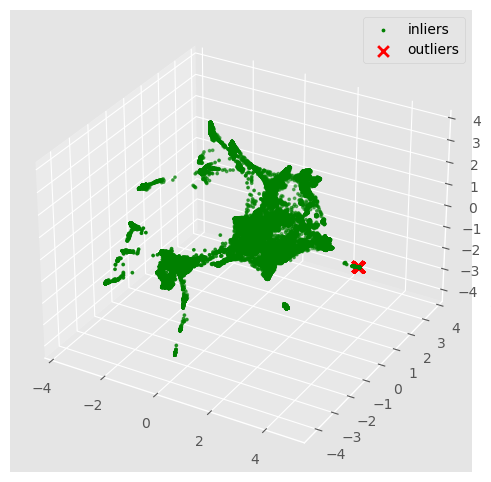

In [12]:
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
ax.set_zlabel("x_composite_3_using_tSNE")
# Plotting the compressed data points
ax.scatter(data_50k_reduced[:, 0], data_50k_reduced[:, 1], zs=data_50k_reduced[:, 2], s=3, lw=1, label="inliers",c="green")
# Plot x(s) for the ground truth outliers
out_index = [i for i in outlier_index if i <= 50000]
ax.scatter(data_50k_reduced[out_index,0],data_50k_reduced[out_index,1], data_50k_reduced[out_index,2], lw=2, s=60, 
           marker="x", c="red", label="outliers")
ax.legend()
plt.show()

The analysis reveals a distinct shape compared to the previous results obtained using PCA. In this case, despite inliers being scattered in different directions, there are noticeable inter-connectivities among them. The observation suggests that outliers are more accurately detected in this analysis, considering all non-linear inter-relationships among the features.






## Algorithm-1A: Isolation Forest in Unsupervised Sense:

The Isolation Forest algorithm isolates anomalous points from a sample (normal points) by recursively creating partitions. This is done by randomly selecting an attribute and then choosing a split value for that attribute. The algorithm follows a decision tree approach, resembling a "forest." In this case, the Isolation Forest algorithm is applied in a truly unsupervised manner, meaning that labels are not used in the process.






In [13]:
from sklearn.ensemble import IsolationForest
datacopy = data.copy()
datacopy.columns
to_model_cols = datacopy.columns[0:30]
clf = IsolationForest(n_estimators=10, max_samples='auto', contamination=float(.0009), 
                      max_features=1.0, bootstrap=False, n_jobs=-1, random_state=12345, verbose=0)
clf.fit(datacopy[to_model_cols])
pred = clf.predict(datacopy[to_model_cols])
datacopy['Class'] = pred
outliers = datacopy.loc[datacopy['Class']==-1]
outlier_index=list(outliers.index)
#Find the number of anomalies and normal points (points classified as "-1" are anomalous)
print(datacopy['Class'].value_counts())

Class
 1    284565
-1       242
Name: count, dtype: int64


In the unsupervised implementation of Isolation Forest (IForest), it successfully detected 242 anomalous points. It's noteworthy that the original dataset contains 492 fraud labels.






## Algorithm-1B: Isolation Forest in Supervised Sense:

The analysis suggests utilizing the given labels in the dataset to assess the model performance of the Isolation Forest algorithm in a supervised learning context. However, it's important to note that anomaly detection algorithms are inherently designed for unsupervised use.






In [14]:
from sklearn.metrics import accuracy_score, classification_report
n_outliers = len(data[data['Class']==1])
outlier_fraction = len(data[data['Class']==1])/float(len(data[data['Class']==0]))
clf = IsolationForest(n_estimators=100, max_samples=len(data.loc[:,data.columns!='Class']), 
                      contamination=outlier_fraction, random_state=12345, verbose=0)
X = data.loc[:,data.columns!='Class']
Y = data['Class']
clf.fit(X)
scores_prediction = clf.decision_function(X)
y_pred = clf.predict(X)
y_pred[y_pred == 1] = 0
y_pred[y_pred == -1] = 1
n_errors = (y_pred != Y).sum()

print("{}: {}".format("No. of Anomalous Points with Isolation Forest ",n_errors))
print("Accuracy Score :",accuracy_score(Y,y_pred))
print("Classification Report :")
print(classification_report(Y,y_pred))

No. of Anomalous Points with Isolation Forest : 661
Accuracy Score : 0.9976791300775613
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.33      0.33      0.33       492

    accuracy                           1.00    284807
   macro avg       0.66      0.66      0.66    284807
weighted avg       1.00      1.00      1.00    284807



The application of the Isolation Forest algorithm with a supervised learning approach yielded 661 anomalous points with an accuracy of 99.76%.






## Algorithm-2A: Local Outlier Factor in Unsupervised Sense

The Local Outlier Factor (LOF) identifies anomalous data points by assessing the local deviation of a specific data point in relation to its neighboring data points. Its working principle is akin to density-based clustering algorithms such as DBSCAN. In the analysis, LOF is initially applied in a purely unsupervised manner, without using labels. Additionally, a smaller sample of data is used to mitigate longer execution times.






In [15]:
from sklearn.neighbors import LocalOutlierFactor
clf_lof = LocalOutlierFactor(n_neighbors=30, algorithm='auto', contamination=.1)
standardized_data_without_class = StandardScaler().fit_transform(data.loc[:,data.columns!='Class'])
data_50k_new = standardized_data_without_class[0:50000]
data_50k_df = pd.DataFrame(data=data_50k_new)
y_pred = clf_lof.fit_predict(data_50k_df)
LOF_Scores = clf_lof.negative_outlier_factor_
LOF_pred=pd.Series(y_pred).replace([-1,1],[1,0])
LOF_anomalies=data_50k_df[LOF_pred==1]

In [16]:
# Check if all scores are negative
LOF_Scores

array([-1.06437549, -1.0786067 , -1.25629538, ..., -1.11123033,
       -1.01999028, -1.09610749])

In [17]:
import numpy as np
cmap=np.array(["skyblue","red"])
def plot_lof(i):
    plt.scatter(data_50k_df.iloc[:,i],data_50k_df.iloc[:,i+1],c="skyblue",s=40, edgecolor="k")
    plt.scatter(LOF_anomalies.iloc[:,i],LOF_anomalies.iloc[:,i+1],c="red", s=40, edgecolor="k")
    plt.title("Visualize Local Outlier Factors between Feature Pair: V{} and V{}".format(i,i+1))
    plt.xlabel("V{}".format(i))
    plt.ylabel("V{}".format(i+1))

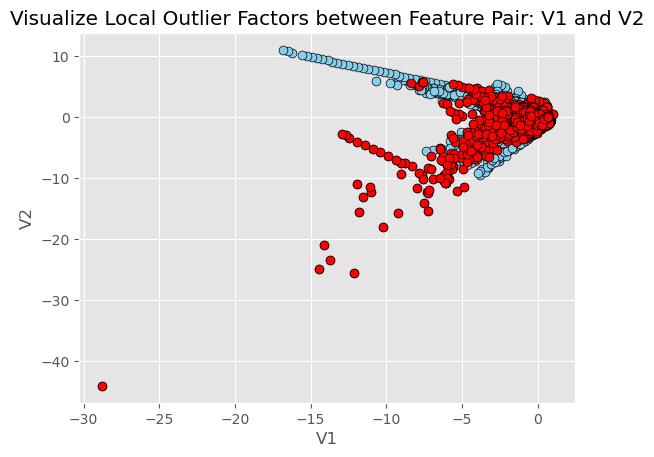

In [18]:
plot_lof(1)


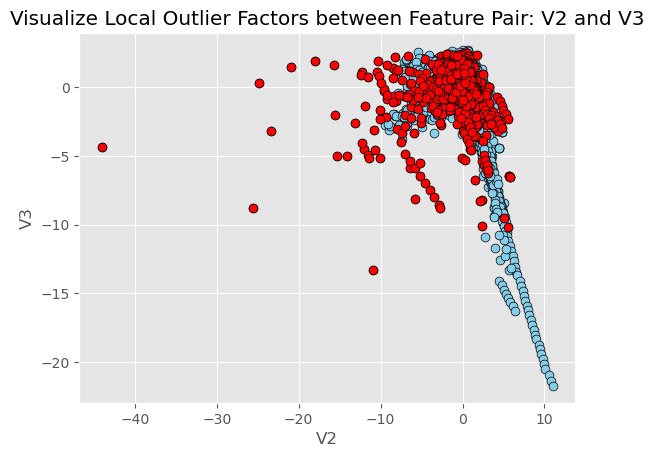

In [19]:
plot_lof(2)


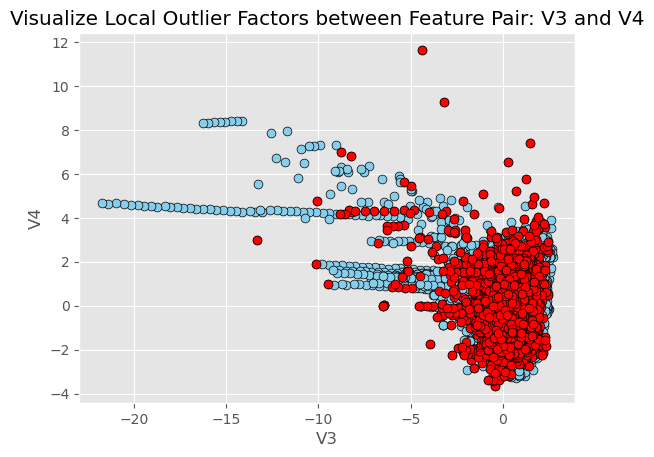

In [20]:
plot_lof(3)


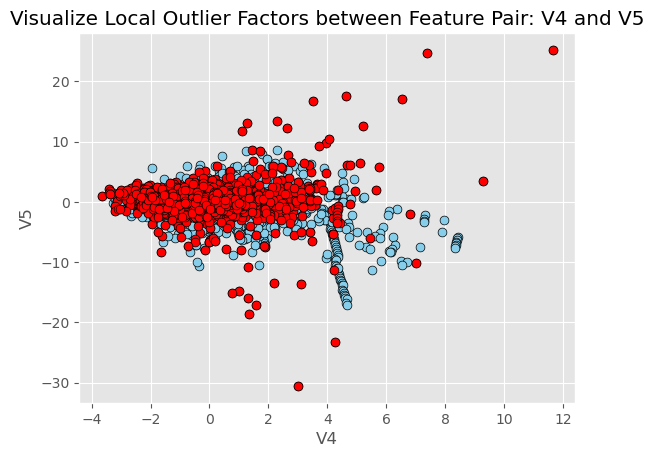

In [21]:
plot_lof(4)

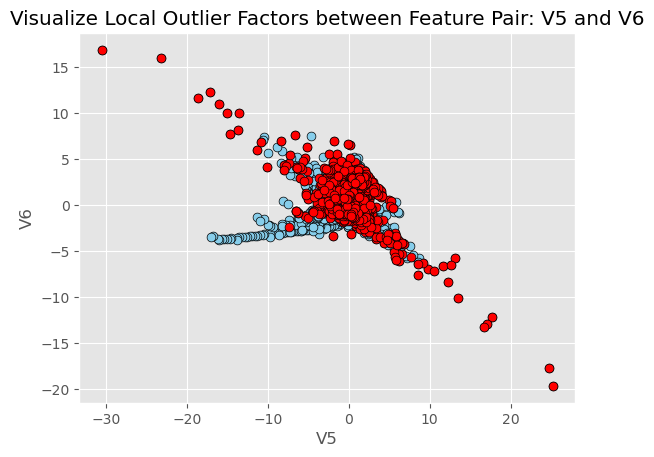

In [22]:
plot_lof(5)


## Algorithm-2B: Local Outlier Factor using Supervised Learning

Similar to the earlier approach, the Local Outlier Factor (LOF) is employed with a supervised learning aspect by explicitly utilizing the "Class" labels in the analysis.






from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import accuracy_score, classification_report
n_outliers = len(data[data['Class']==1])
outlier_fraction = len(data[data['Class']==1])/float(len(data[data['Class']==0]))
clflof = LocalOutlierFactor(n_neighbors=30, algorithm='auto', contamination=outlier_fraction)
X = data.loc[:,data.columns!='Class']
Y = data['Class']
y_pred = clflof.fit_predict(X)
y_pred[y_pred == 1] = 0
y_pred[y_pred == -1] = 1
n_errors = (y_pred != Y).sum()
print("{}: {}".format("No. of Anomalous Points with Local Outlier Factors ",n_errors))
print("Accuracy Score :")
print(accuracy_score(Y,y_pred))
print("Classification Report :")
print(classification_report(Y,y_pred))


The implementation of the Local Outlier Factor (LOF) algorithm, utilizing the "Class" labels, has predicted 949 anomalies with an accuracy of 99.67%.

## Algorithm-3A: Elliptic Envelope using Unsupervised Learning

In [23]:
print("Hello")

Hello


Elliptic Envelope (EE) is employed to fit a multivariate Gaussian with a robust covariance estimate. The algorithm fits the data into the tightest Gaussian (smallest volume ellipsoid), discarding a fixed fraction of contamination points set by the user. In this analysis, Elliptic Envelope is used in a purely unsupervised manner without utilizing "Class" labels.






In [24]:
from sklearn.covariance import EllipticEnvelope

clf_ee = EllipticEnvelope(assume_centered=False, contamination=0.1, random_state=12345, store_precision=True, 
                          support_fraction=0.7)
y_predict = clf_ee.fit_predict(data_50k_df)
ee_predict = pd.Series(y_predict).replace([-1,1],[1,0])
ee_anomalies = data_50k_df[ee_predict==1]

In [25]:

cmap=np.array(['skyblue','red'])
def plot_EE(i):
    plt.scatter(data_50k_df.iloc[:,i],data_50k_df.iloc[:,i+1],c='skyblue',s=40, edgecolor="k")
    plt.scatter(ee_anomalies.iloc[:,i],ee_anomalies.iloc[:,i+1],c='red', s=40, edgecolor="k")
    plt.title("Visualize Elliptic Envelope Anomalies between Feature Pair: V{} and V{}".format(i,i+1))
    plt.xlabel("V{}".format(i))
    plt.ylabel("V{}".format(i+1))

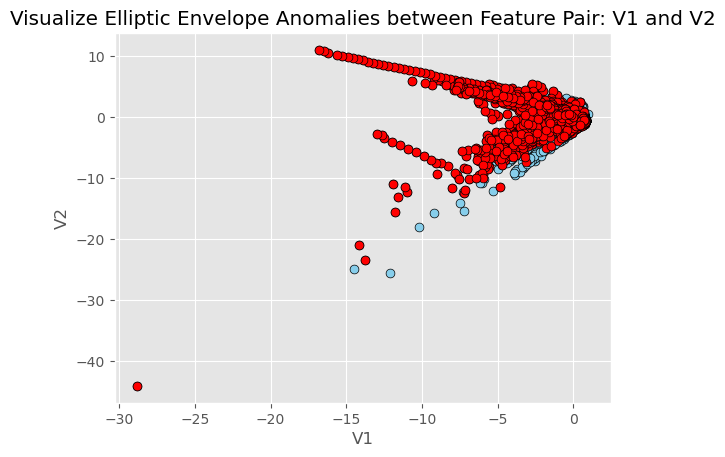

In [26]:
plot_EE(1)


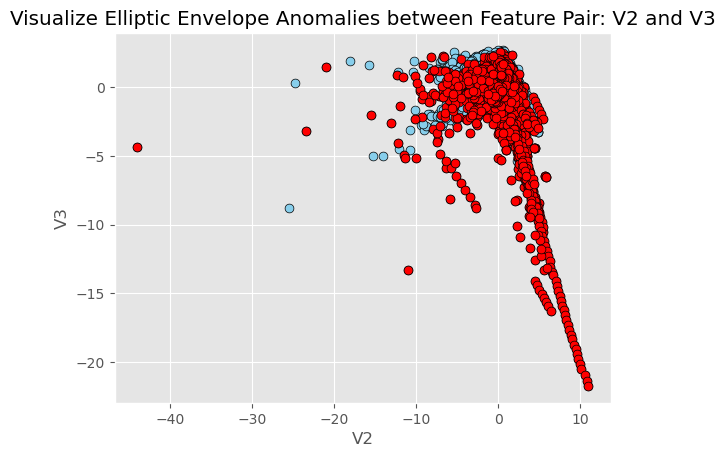

In [27]:
plot_EE(2)


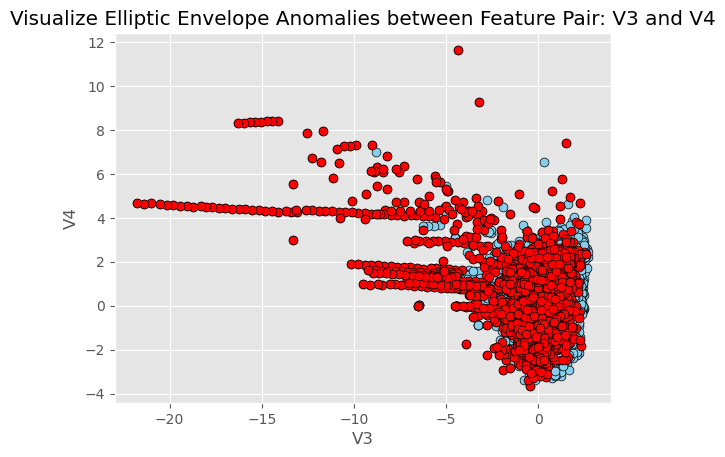

In [28]:
plot_EE(3)


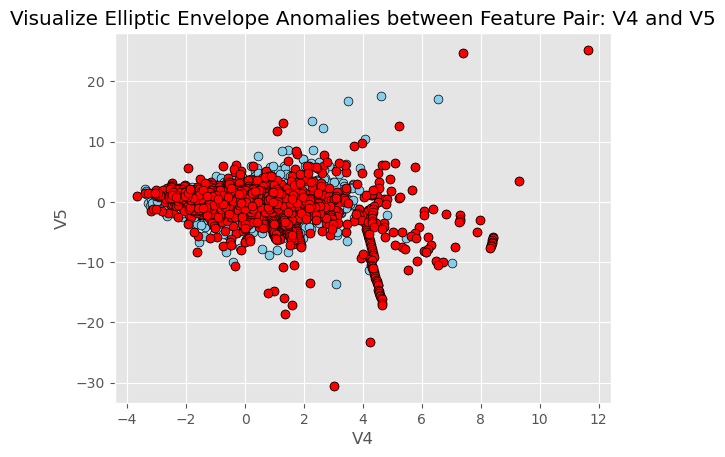

In [29]:
plot_EE(4)


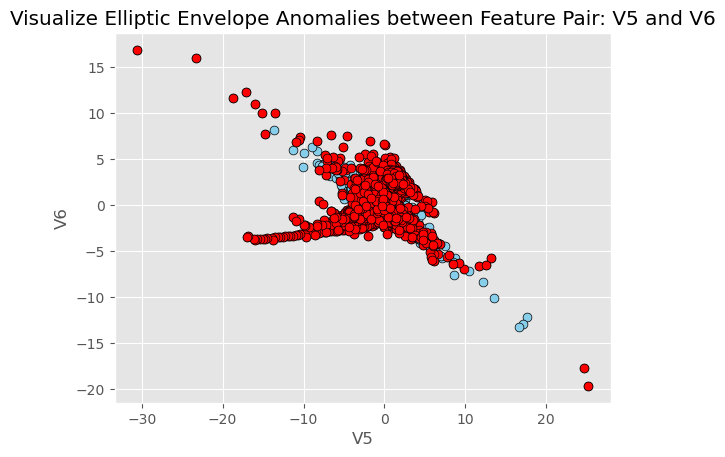

In [30]:
plot_EE(5)


The analysis prompts a comparison of visual differences between the results obtained using Elliptic Envelope (EE) and those from the Local Outlier Factor (LOF). The intention is to identify disparities in the visual representation of anomalies between the two algorithms.






## Algorithm-3B: Elliptic Envelope using Supervised Learning

Continuing in a similar , Elliptic Envelope (EE) is now employed in a supervised manner, utilizing the available labels in the analysis.






In [31]:
from sklearn.covariance import EllipticEnvelope
from sklearn.metrics import accuracy_score, classification_report
n_outliers = len(data[data['Class']==1])
outlier_fraction = len(data[data['Class']==1])/float(len(data[data['Class']==0]))
clfee = EllipticEnvelope(assume_centered=False, contamination=outlier_fraction, random_state=12345, 
                         store_precision=True, support_fraction=0.7)
X = data.loc[:,data.columns!='Class']
Y = data['Class']
y_pred = clfee.fit_predict(X)
y_pred[y_pred == 1] = 0
y_pred[y_pred == -1] = 1
n_errors = (y_pred != Y).sum()
print("{}: {}".format("No. of Anomalous Points with Elliptic Envelope ",n_errors))
print("Accuracy Score :")
print(accuracy_score(Y,y_pred))
print("Classification Report :")
print(classification_report(Y,y_pred))

No. of Anomalous Points with Elliptic Envelope : 769
Accuracy Score :
0.9972999259147423
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.22      0.22      0.22       492

    accuracy                           1.00    284807
   macro avg       0.61      0.61      0.61    284807
weighted avg       1.00      1.00      1.00    284807



The supervised implementation of Elliptic Envelope (EE) predicted 799 frauds with an accuracy of 99.72%.






## Algorithm-4A: One-Class SVM in Unsupervised Sense

The One-Class SVM is designed for datasets with a single class and few anomalies. It is an unsupervised algorithm for novelty detection, functioning similarly to SVM. Instead of using a hyperplane, it employs a hypersphere to encompass all data points. In this analysis, One-Class SVM is applied without using labels initially.






In [32]:
from sklearn import svm
clf_svm = svm.OneClassSVM(kernel="rbf", degree=3, gamma=0.1, nu=0.01, max_iter=-1)
y_predict = clf_svm.fit_predict(data_50k_df)
svm_predict = pd.Series(y_predict).replace([-1,1],[1,0])
svm_anomalies = data_50k_df[svm_predict==1]

In [33]:
cmap=np.array(['skyblue','red'])
def plot_OCSVM(i):
    plt.scatter(data_50k_df.iloc[:,i],data_50k_df.iloc[:,i+1],c='skyblue',s=40, edgecolor="k")
    plt.scatter(svm_anomalies.iloc[:,i],svm_anomalies.iloc[:,i+1],c='red', s=40, edgecolor="k")
    plt.title("Visualize OC-SVM Anomalies between Feature Pair: V{} and V{}".format(i,i+1))
    plt.xlabel("V{}".format(i))
    plt.ylabel("V{}".format(i+1))

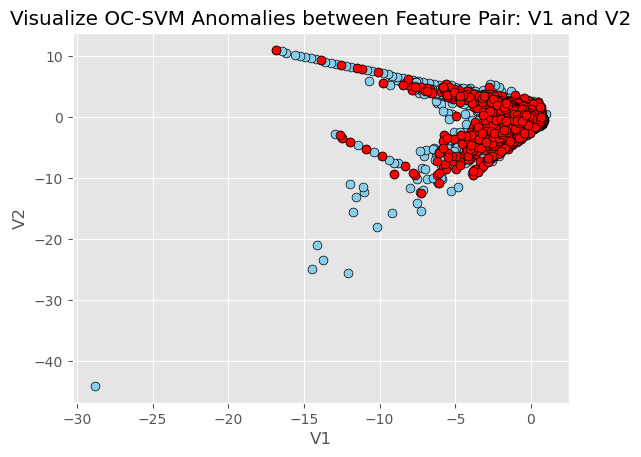

In [34]:
plot_OCSVM(1)


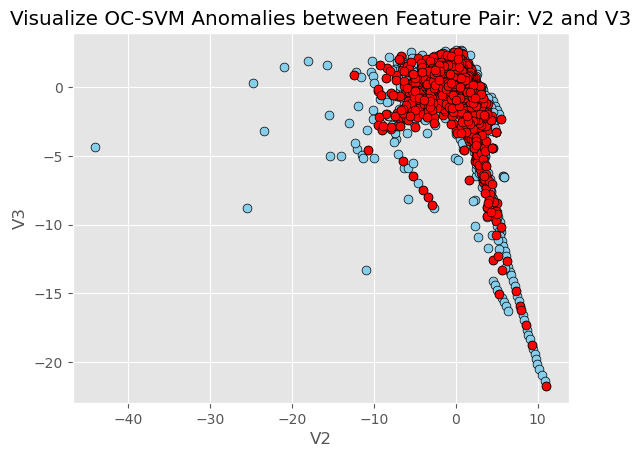

In [35]:
plot_OCSVM(2)


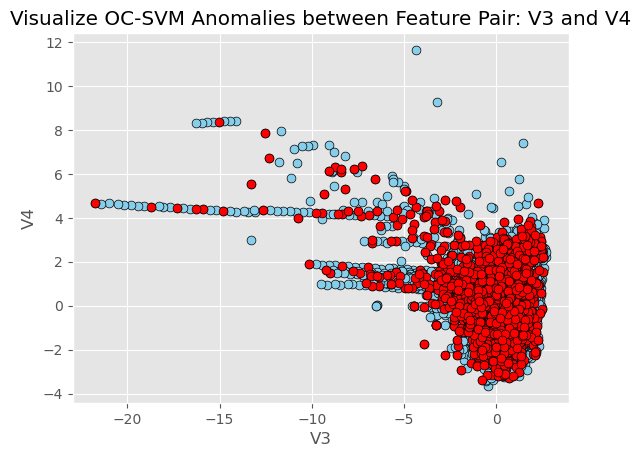

In [36]:
plot_OCSVM(3)


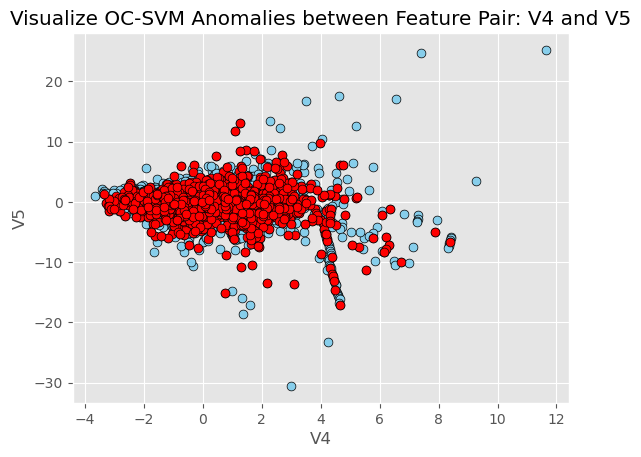

In [37]:
plot_OCSVM(4)


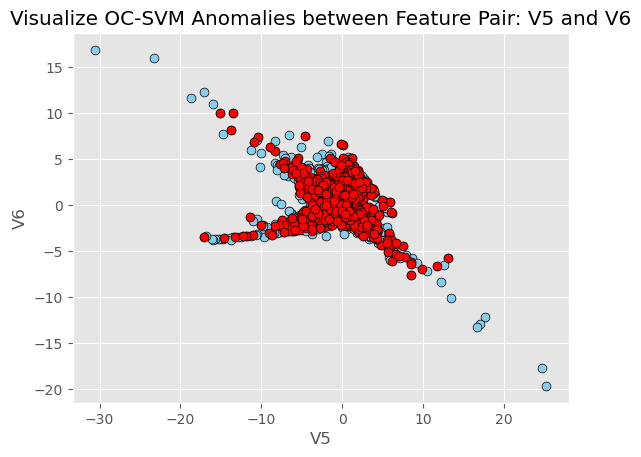

In [38]:
plot_OCSVM(5)


The analysis using One-Class SVM reveals a notably low number of sky-blue points. This observation underscores the effectiveness of One-Class SVM in detecting rare events or anomalies within the dataset.






## Algorithm-4B: One-Class SVM in Supervised Sense

Continuing the analysis, the One-Class SVM algorithm will be applied with the inclusion of labels for experimental purposes.






In [39]:
from sklearn.svm import OneClassSVM
from sklearn.metrics import accuracy_score, classification_report
outlier_fraction = len(data[data['Class']==1])/float(len(data[data['Class']==0]))
clfsvm = OneClassSVM(kernel="rbf", nu=outlier_fraction)
X = data.loc[:,data.columns!='Class']
Y = data['Class']
y_pred = clfsvm.fit_predict(X)
y_pred[y_pred == 1] = 0
y_pred[y_pred == -1] = 1
n_errors = (y_pred != Y).sum()
print("{}: {}".format("No. of Anomalous Points with One-Class SVM ",n_errors))
print("Accuracy Score :")
print(accuracy_score(Y,y_pred))
print("Classification Report :")
print(classification_report(Y,y_pred))

No. of Anomalous Points with One-Class SVM : 985
Accuracy Score :
0.9965415175891043
Classification Report :
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    284315
           1       0.00      0.00      0.00       492

    accuracy                           1.00    284807
   macro avg       0.50      0.50      0.50    284807
weighted avg       1.00      1.00      1.00    284807



In the supervised implementation of One-Class SVM (OCSVM), the model predicted 985 anomalies with an accuracy of 99.65%.






## Self-Organized Maps to Detect Frauds:

The Self-Organizing Map (SOM) is a neural model trained through unsupervised learning to generate a low-dimensional, typically 2D, discretized map. It serves as a potent visual tool, particularly useful for easily detecting rare events such as frauds.






In [40]:
!pip install pyexpat
!pip install libxml2

!pip install minisom
import minisom

minisom.__version__



Traceback (most recent call last):
  File "C:\Users\abudh\anaconda3\Scripts\pip-script.py", line 9, in <module>
    sys.exit(main())
             ^^^^^^
  File "C:\Users\abudh\anaconda3\Lib\site-packages\pip\_internal\cli\main.py", line 77, in main
    command = create_command(cmd_name, isolated=("--isolated" in cmd_args))
              ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\abudh\anaconda3\Lib\site-packages\pip\_internal\commands\__init__.py", line 114, in create_command
    module = importlib.import_module(module_path)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\abudh\anaconda3\Lib\importlib\__init__.py", line 126, in import_module
    return _bootstrap._gcd_import(name[level:], package, level)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "<frozen importlib._bootstrap>", line 1204, in _gcd_import
  File "<frozen importlib._bootstrap>", line 1176, in _find_and_load
  File "<frozen importlib._boots

AttributeError: module 'minisom' has no attribute '__version__'

In [44]:
from sklearn.preprocessing import MinMaxScaler
from minisom import MiniSom

X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values
mm = MinMaxScaler(feature_range = (0, 1))
X = mm.fit_transform(X)
som = MiniSom(x = 10, y = 10, input_len = 30, sigma = 1.0, learning_rate = 0.5)
som.random_weights_init(X)
som.train_random(data = X, num_iteration = 100)

In [ ]:
from pylab import bone, pcolor, colorbar, plot, show
print("Hello")
bone()
pcolor(som.distance_map().T)
colorbar()
markers = ['o', 's']
colors = ['r', 'g']
print("Hello")
for i, x in enumerate(X):
    w = som.winner(x)
    plot(w[0]+0.5, w[1]+0.5, markers[y[i]], markeredgecolor = colors[y[i]],
    markerfacecolor = 'None', markersize = 15, markeredgewidth = 2)
    print(i,x)
Print("Hello2")
show()

Hello
Hello
0 [0.         0.93519234 0.76649042 0.8813649  0.31302266 0.76343873
 0.26766864 0.26681518 0.7864442  0.47531173 0.51060048 0.25248432
 0.68090763 0.3715906  0.63559053 0.4460837  0.43439239 0.73717255
 0.65506586 0.59486323 0.58294223 0.56118439 0.52299212 0.66379298
 0.39125268 0.58512179 0.39455679 0.41897614 0.31269663 0.00582379]
1 [0.00000000e+00 9.78541955e-01 7.70066651e-01 8.40298490e-01
 2.71796491e-01 7.66120336e-01 2.62191698e-01 2.64875439e-01
 7.86298353e-01 4.53980968e-01 5.05267346e-01 3.81187722e-01
 7.44341569e-01 4.86190176e-01 6.41219007e-01 3.83839664e-01
 4.64105178e-01 7.27793983e-01 6.40681094e-01 5.51930422e-01
 5.79529753e-01 5.57839915e-01 4.80236960e-01 6.66937823e-01
 3.36439996e-01 5.87290252e-01 4.46012969e-01 4.16345145e-01
 3.13422663e-01 1.04705276e-04]
2 [5.78730497e-06 9.35217023e-01 7.53117667e-01 8.68140819e-01
 2.68765507e-01 7.62328786e-01 2.81122121e-01 2.70177183e-01
 7.88042263e-01 4.10602741e-01 5.13018038e-01 3.22422114e-01
 7.0

The SOM visualization highlights anomalies with red circles encircled within green squares. Particularly, red circles falling in pure white squares indicate the highest possibility of fraud. In the presented SOM, squares (5,9) and (2,6) are fully white, suggesting they have the highest likelihood of fraud. It's essential to note that SOM may generate a different map in subsequent runs, and the position of white squares may vary.






In [46]:
# Mapping the winning node
mappings = som.win_map(X)
# Finding frauds
import numpy as np
frauds = np.concatenate((mappings[(5, 9)], mappings[(2,6)]), axis = 0)
frauds = mm.inverse_transform(frauds)

In [47]:
# Print the list of frauds
frauds

array([[ 6.74520000e+04, -7.58211715e-01, -4.22289099e-01, ...,
         1.06025409e-01,  5.19172038e-02,  3.24000000e+00],
       [ 6.95120000e+04,  1.25807281e+00, -6.20131201e-01, ...,
         8.12809290e-02,  3.07378806e-02,  7.00300000e+01],
       [ 7.40920000e+04, -1.70828004e+00, -2.97153951e-01, ...,
         1.05558343e-01, -8.91181258e-02,  3.14000000e+00],
       ...,
       [ 1.29884000e+05,  1.67917431e+00, -1.16733141e+00, ...,
         1.05729132e-01, -2.12628961e-02,  1.41000000e+02],
       [ 1.32059000e+05, -1.45375691e+00, -6.40898375e+00, ...,
        -2.09916497e-01,  2.67911768e-01,  1.77000000e+03],
       [ 1.34170000e+05,  1.64108749e+00, -1.68556402e+00, ...,
         1.21040156e-01, -1.06732267e-02,  1.48950000e+02]])